# GE Bracket

Geometry from the GE jet engine bracket challenge: https://grabcad.com/challenges/ge-jet-engine-bracket-challenge

Load cases considered in the optimization: 35.6 kN vertical force / 37.8 kN horizontal force

For numerical reasons, the force was rescaled by a factor of 0.01. Therefore, to obtain the actual compliance it is necessary to multiply the output by 10000 and to obtain the actual displament it is necessary to multiply the output by 100.

Ansys model:
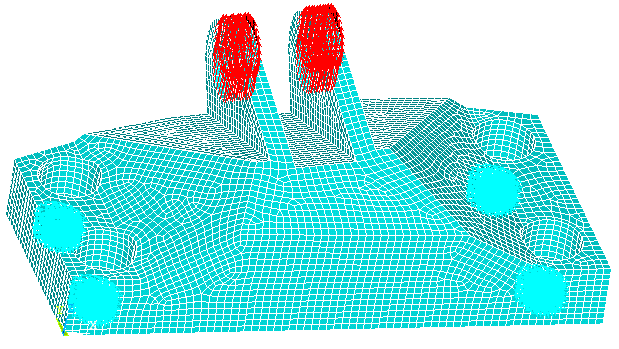

In [1]:
import os, sys
path = os.path.abspath(os.path.join('..'))
os.chdir(path)
if path not in sys.path:
    sys.path.append(path)

In [2]:
import matplotlib.pyplot as plt
import niceplots
plt.style.use(niceplots.get_style())

from pathlib import Path
from optim import TopOpt, Post3D

ANSYS_path = Path("mapdl")
res_dir    = Path("results/bracket/")
mod_dir    = Path("models/")
TopOpt.set_paths(ANSYS_path, res_dir, mod_dir)

In [3]:
# {t/mm^3, MPa, -, kgCO2/kg}
flax = {'rho': 1470e-12, 'E': 53.5e3, 'v': 0.355, 'CO2': 0.44}
pla  = {'rho': 1290e-12, 'E': 5.19e3, 'v': 0.39, 'CO2': 2.115}
Vfiber  = 0.5

Ex, Ey, nuxy, nuyz, Gxy, rho, CO2mat = TopOpt.rule_mixtures(fiber=flax, matrix=pla, Vfiber=Vfiber)
CO2veh = 1030 * 25 * 3.83 # kg_fuel/kg_transported/year * years * kgCO2/kg_fuel = kgCO2/kg

In [4]:
solver1 = TopOpt(inputfiles=('bracket_ver','bracket_hor'), dim='3D_free', jobname='mult_free')
solver1.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
solver1.set_volfrac(0.3)
solver1.set_filters(r_rho=5, r_theta=7)
solver1.set_initial_conditions('random')
solver1.set_optim_options(max_iter=50, tol=5e-3, continuation=True)

solver1.run()
solver1.save()

solver1.print_timing()
print()
print('Maximum displacement - vertical force: {:.2f} mm'.format(100 * solver1.get_max_disp(load_case=1)))
print('Maximum displacement - horizontal force: {:.2f} mm'.format(100 * solver1.get_max_disp(load_case=2)))

Iteration   0...  c_1 =    21.4253, c_2 =     4.5536, 
Iteration   1...  c_1 =    30.5062, c_2 =     7.6928, 
Iteration   2...  c_1 =    27.9714, c_2 =     7.4443, 
Iteration   3...  c_1 =    30.4409, c_2 =     9.6043, 
Iteration   4...  c_1 =    25.8592, c_2 =     7.6975, 
Iteration   5...  c_1 =    22.1797, c_2 =     6.9063, 
Iteration   6...  c_1 =    20.4021, c_2 =     6.6954, 
Iteration   7...  c_1 =    18.0635, c_2 =     6.0746, 
Iteration   8...  c_1 =    16.6214, c_2 =     5.7663, 
Iteration   9...  c_1 =    15.9254, c_2 =     5.9497, 
Iteration  10...  c_1 =    15.0853, c_2 =     5.4985, 
Iteration  11...  c_1 =    14.3103, c_2 =     5.3742, 
Iteration  12...  c_1 =    14.1960, c_2 =     5.4428, 
Iteration  13...  c_1 =    13.4735, c_2 =     5.1831, 
Iteration  14...  c_1 =    13.2232, c_2 =     5.1114, 
Iteration  15...  c_1 =    13.1388, c_2 =     5.1623, 
Iteration  16...  c_1 =    12.8134, c_2 =     5.0036, 
Iteration  17...  c_1 =    12.6606, c_2 =     4.9870, 
Iteration 

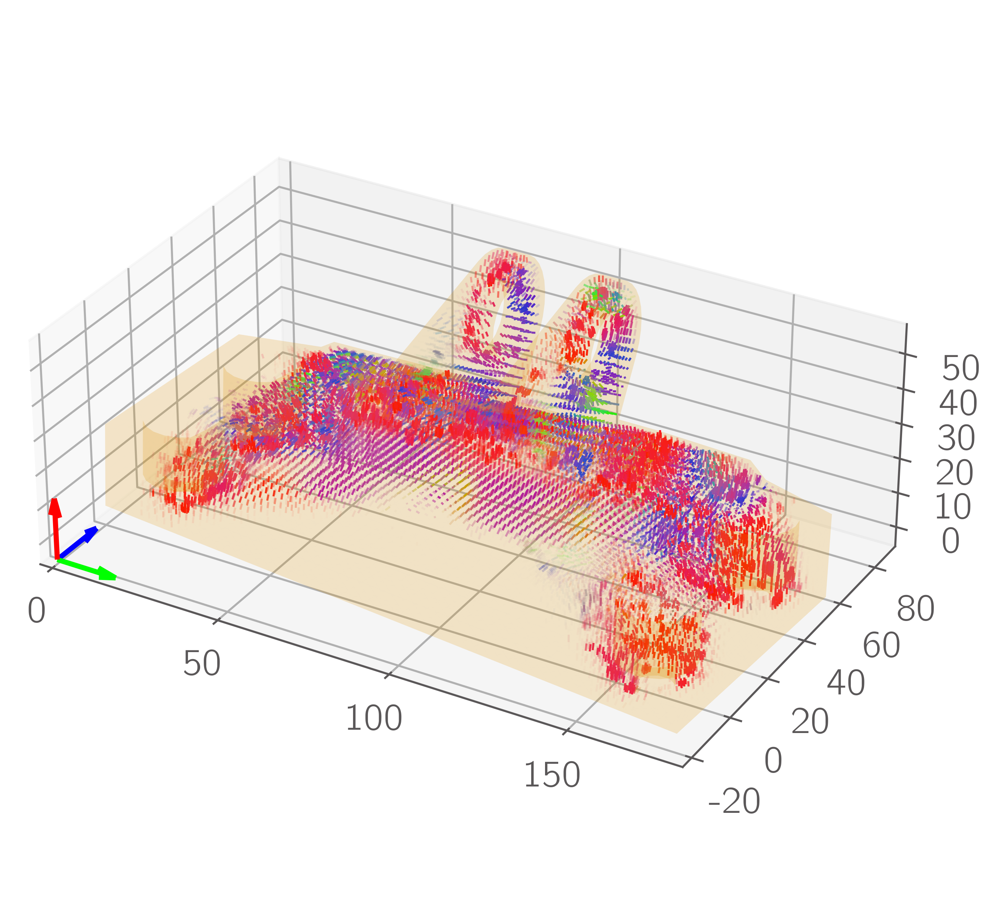

In [9]:
# solver1 = TopOpt.load('results/bracket/mult_free/topopt.json')
post1 = Post3D(solver1)
post1.plot(domain_stl='models/bracket.stl')

In [6]:
solver2 = TopOpt(inputfiles='bracket_ver', dim='3D_free', jobname='vert_free')
solver2.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
solver2.set_volfrac(0.3)
solver2.set_filters(r_rho=5, r_theta=7)
solver2.set_initial_conditions('random')
solver2.set_optim_options(max_iter=50, tol=5e-3, continuation=True)

solver2.run()
solver2.save()

solver2.print_timing()
print()
print('Maximum displacement - vertical force: {:.2f} mm'.format(100 * solver2.get_max_disp()))

Iteration   0...  c_1 =    21.3293, 
Iteration   1...  c_1 =    30.3370, 
Iteration   2...  c_1 =    27.1927, 
Iteration   3...  c_1 =    29.1841, 
Iteration   4...  c_1 =    25.0801, 
Iteration   5...  c_1 =    21.3919, 
Iteration   6...  c_1 =    20.3234, 
Iteration   7...  c_1 =    18.2032, 
Iteration   8...  c_1 =    16.7992, 
Iteration   9...  c_1 =    16.2998, 
Iteration  10...  c_1 =    15.3507, 
Iteration  11...  c_1 =    14.6655, 
Iteration  12...  c_1 =    14.4619, 
Iteration  13...  c_1 =    13.9189, 
Iteration  14...  c_1 =    13.5907, 
Iteration  15...  c_1 =    13.5440, 
Iteration  16...  c_1 =    15.6319, 
Iteration  17...  c_1 =    14.8029, 
Iteration  18...  c_1 =    14.5985, 
Iteration  19...  c_1 =    14.0657, 
Iteration  20...  c_1 =    13.9009, 
Iteration  21...  c_1 =    13.8194, 
Iteration  22...  c_1 =    13.5927, 
Iteration  23...  c_1 =    13.5187, 
Iteration  24...  c_1 =    13.5507, 
Iteration  25...  c_1 =    14.5869, 
Iteration  26...  c_1 =    14.1029, 
I

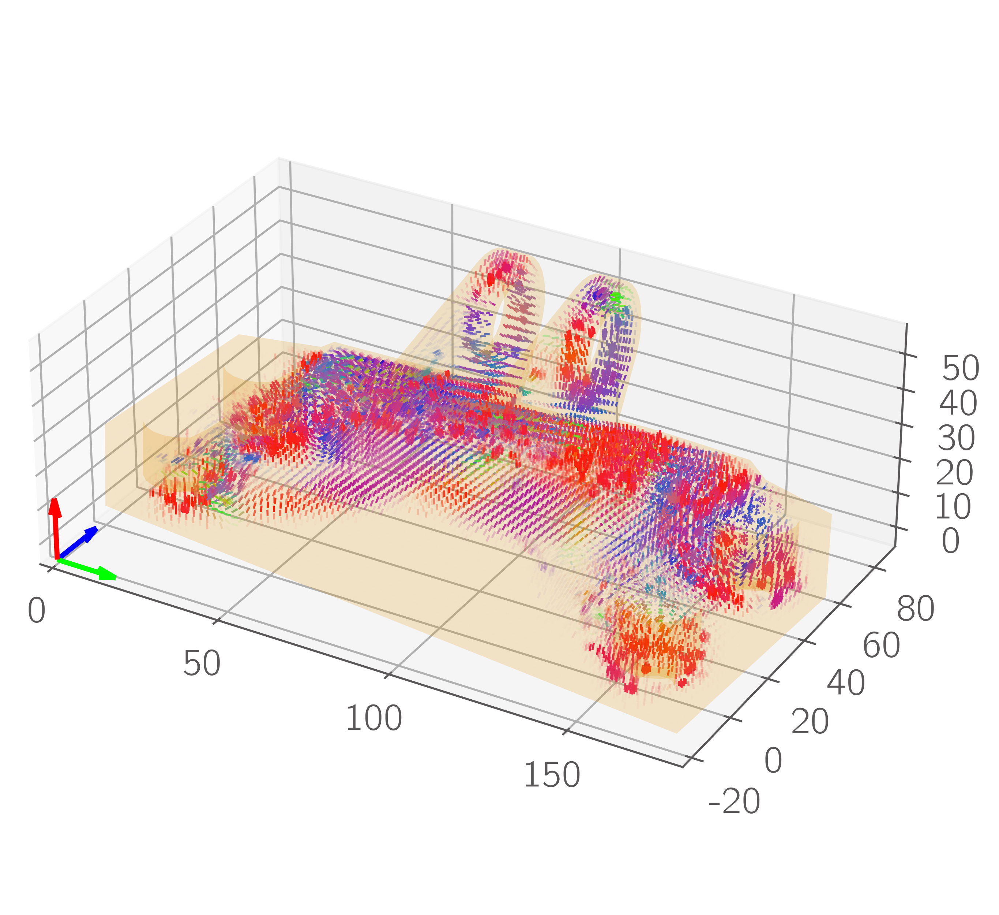

In [4]:
# solver2 = TopOpt.load('results/bracket/vert_free/topopt.json')
post2 = Post3D(solver2)
post2.plot(domain_stl='models/bracket.stl')

In [8]:
solver3 = TopOpt(inputfiles='bracket_hor', dim='3D_free', jobname='hor_free')
solver3.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
solver3.set_volfrac(0.3)
solver3.set_filters(r_rho=5, r_theta=7)
solver3.set_initial_conditions('random')
solver3.set_optim_options(max_iter=50, tol=5e-3, continuation=True)

solver3.run()
solver3.save()

solver3.print_timing()
print()
print('Maximum displacement - horizontal force: {:.2f} mm'.format(100 * solver3.get_max_disp()))

Iteration   0...  c_1 =     4.5422, 
Iteration   1...  c_1 =     7.4730, 
Iteration   2...  c_1 =     6.0688, 
Iteration   3...  c_1 =     6.1438, 
Iteration   4...  c_1 =     5.1708, 
Iteration   5...  c_1 =     4.3168, 
Iteration   6...  c_1 =     4.0683, 
Iteration   7...  c_1 =     3.6068, 
Iteration   8...  c_1 =     3.2848, 
Iteration   9...  c_1 =     3.2257, 
Iteration  10...  c_1 =     2.9716, 
Iteration  11...  c_1 =     2.8400, 
Iteration  12...  c_1 =     2.7925, 
Iteration  13...  c_1 =     2.6680, 
Iteration  14...  c_1 =     2.5969, 
Iteration  15...  c_1 =     2.5805, 
Iteration  16...  c_1 =     2.5182, 
Iteration  17...  c_1 =     2.4950, 
Iteration  18...  c_1 =     2.4984, 
Iteration  19...  c_1 =     2.8791, 
Iteration  20...  c_1 =     2.7595, 
Iteration  21...  c_1 =     2.7409, 
Iteration  22...  c_1 =     2.6833, 
Iteration  23...  c_1 =     2.6672, 
Iteration  24...  c_1 =     2.6691, 
Iteration  25...  c_1 =     2.9432, 
Iteration  26...  c_1 =     2.8470, 
I

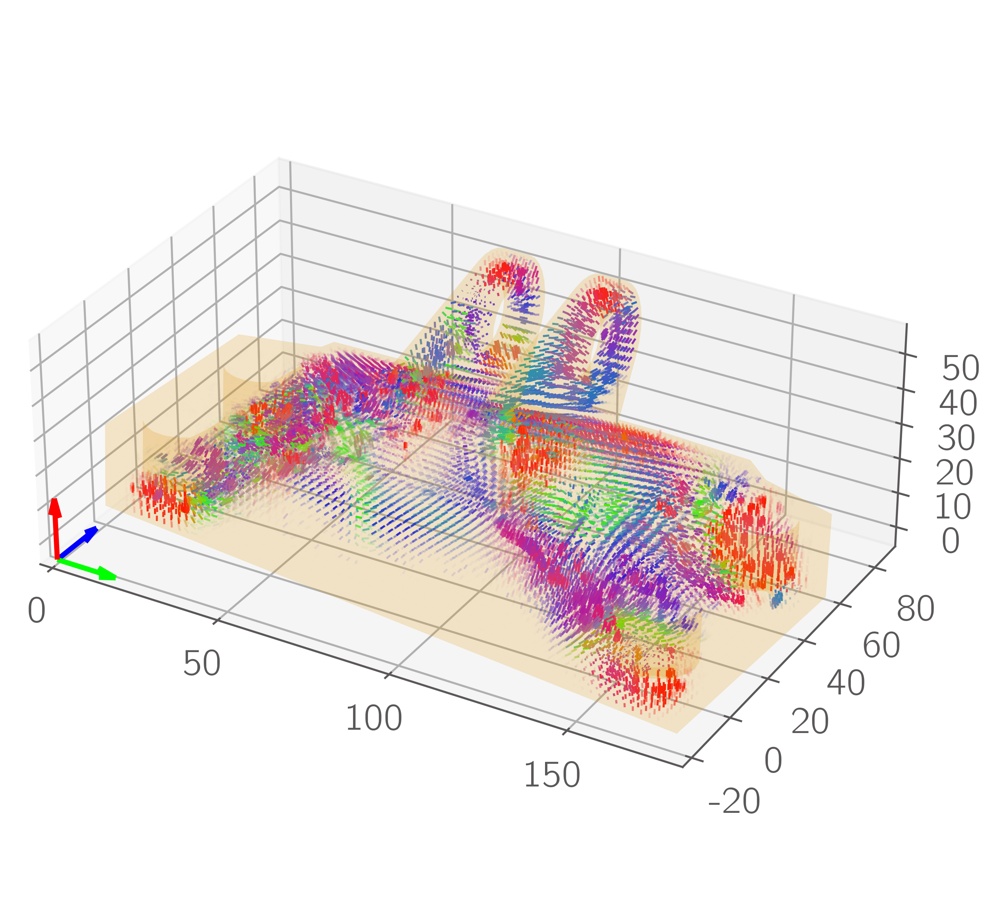

In [5]:
# solver3 = TopOpt.load('results/bracket/hor_free/topopt.json')
post3 = Post3D(solver3)
post3.plot(domain_stl='models/bracket.stl')

In [10]:
solver4 = TopOpt(inputfiles=('bracket_ver','bracket_hor'), dim='3D_layer', jobname='mult_layer')
solver4.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
solver4.set_volfrac(0.3)
solver4.set_filters(r_rho=5, r_theta=7)
solver4.set_initial_conditions('random')
solver4.set_optim_options(max_iter=50, tol=5e-3, continuation=True)

solver4.run()
solver4.save()

solver4.print_timing()
print()
print('Maximum displacement - vertical force: {:.2f} mm'.format(100 * solver4.get_max_disp(load_case=1)))
print('Maximum displacement - horizontal force: {:.2f} mm'.format(100 * solver4.get_max_disp(load_case=2)))

Iteration   0...  c_1 =    21.2798, c_2 =     4.5806, 
Iteration   1...  c_1 =    26.3944, c_2 =     6.8694, 
Iteration   2...  c_1 =    22.2699, c_2 =     6.0470, 
Iteration   3...  c_1 =    19.8072, c_2 =     5.6049, 
Iteration   4...  c_1 =    16.4917, c_2 =     4.8110, 
Iteration   5...  c_1 =    14.3083, c_2 =     4.3714, 
Iteration   6...  c_1 =    13.1963, c_2 =     4.2931, 
Iteration   7...  c_1 =    12.4282, c_2 =     4.1257, 
Iteration   8...  c_1 =    11.7447, c_2 =     3.9928, 
Iteration   9...  c_1 =    11.5959, c_2 =     4.0546, 
Iteration  10...  c_1 =    11.2074, c_2 =     3.9667, 
Iteration  11...  c_1 =    11.0234, c_2 =     3.9582, 
Iteration  12...  c_1 =    10.8802, c_2 =     3.9923, 
Iteration  13...  c_1 =    10.7221, c_2 =     3.9762, 
Iteration  14...  c_1 =    10.6225, c_2 =     3.9763, 
Iteration  15...  c_1 =    10.6104, c_2 =     4.0385, 
Iteration  16...  c_1 =    11.8692, c_2 =     5.5065, 
Iteration  17...  c_1 =    11.5665, c_2 =     5.6589, 
Iteration 

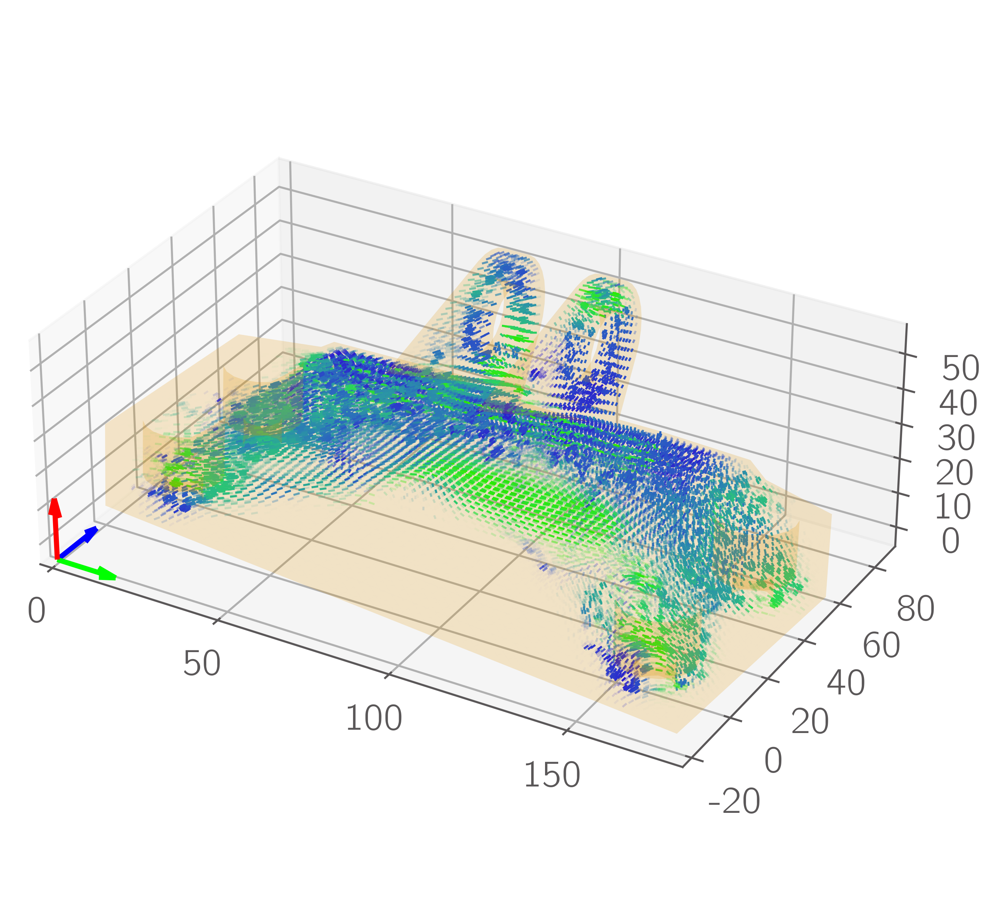

In [6]:
# solver4 = TopOpt.load('results/bracket/mult_layer/topopt.json')
post4 = Post3D(solver4)
post4.plot(domain_stl='models/bracket.stl')

In [12]:
solver5 = TopOpt(inputfiles='bracket_ver', dim='3D_layer', jobname='vert_layer')
solver5.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
solver5.set_volfrac(0.3)
solver5.set_filters(r_rho=5, r_theta=7)
solver5.set_initial_conditions('random')
solver5.set_optim_options(max_iter=50, tol=5e-3, continuation=True)

solver5.run()
solver5.save()

solver5.print_timing()
print()
print('Maximum displacement - vertical force: {:.2f} mm'.format(100 * solver5.get_max_disp()))

Iteration   0...  c_1 =    21.3265, 
Iteration   1...  c_1 =    26.5607, 
Iteration   2...  c_1 =    22.3264, 
Iteration   3...  c_1 =    19.8963, 
Iteration   4...  c_1 =    16.4622, 
Iteration   5...  c_1 =    14.4512, 
Iteration   6...  c_1 =    13.1263, 
Iteration   7...  c_1 =    12.3042, 
Iteration   8...  c_1 =    11.7479, 
Iteration   9...  c_1 =    11.4522, 
Iteration  10...  c_1 =    11.1437, 
Iteration  11...  c_1 =    10.9462, 
Iteration  12...  c_1 =    10.8423, 
Iteration  13...  c_1 =    10.6613, 
Iteration  14...  c_1 =    10.5593, 
Iteration  15...  c_1 =    10.5373, 
Iteration  16...  c_1 =    11.8118, 
Iteration  17...  c_1 =    11.5175, 
Iteration  18...  c_1 =    11.4878, 
Iteration  19...  c_1 =    12.4220, 
Iteration  20...  c_1 =    12.0831, 
Iteration  21...  c_1 =    12.0484, 
Iteration  22...  c_1 =    12.6789, 
Iteration  23...  c_1 =    12.3222, 
Iteration  24...  c_1 =    12.2334, 
Iteration  25...  c_1 =    12.0540, 
Iteration  26...  c_1 =    11.9640, 
I

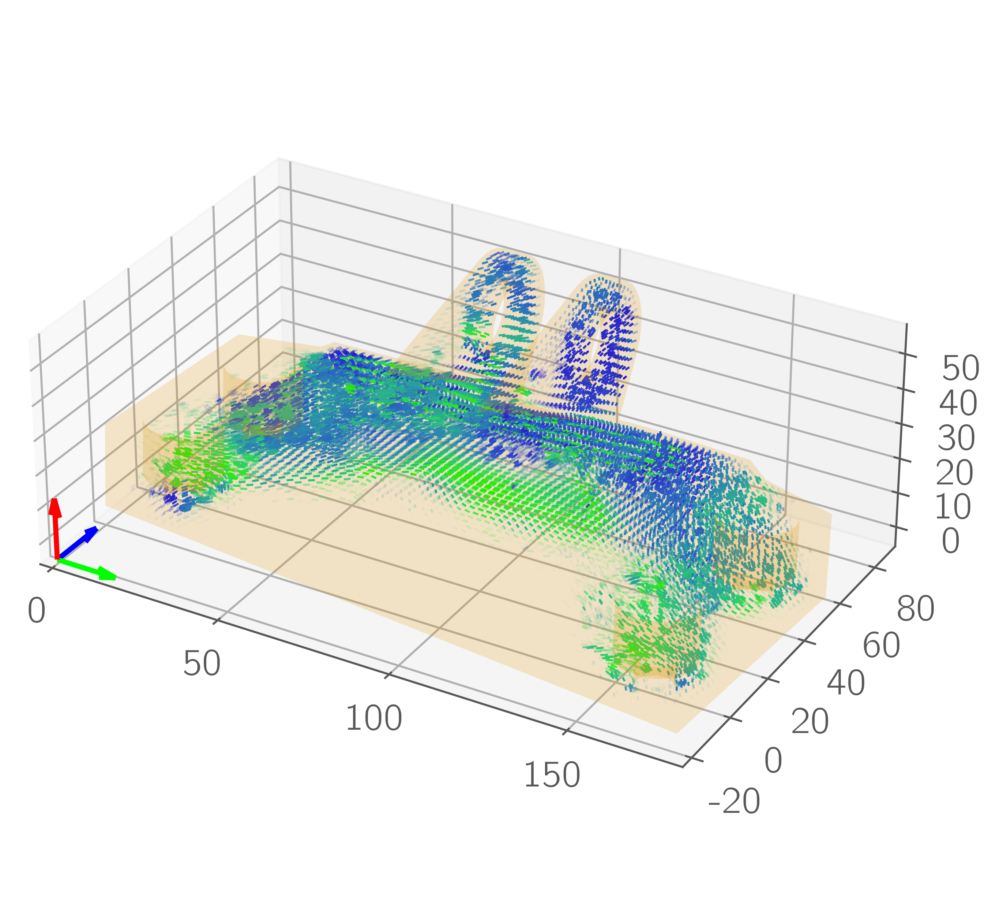

In [7]:
# solver5 = TopOpt.load('results/bracket/vert_layer/topopt.json')
post5 = Post3D(solver5)
post5.plot(domain_stl='models/bracket.stl')

In [14]:
solver6 = TopOpt(inputfiles='bracket_hor', dim='3D_layer', jobname='hor_layer')
solver6.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
solver6.set_volfrac(0.3)
solver6.set_filters(r_rho=5, r_theta=7)
solver6.set_initial_conditions('random')
solver6.set_optim_options(max_iter=50, tol=5e-3, continuation=True)

solver6.run()
solver6.save()

solver6.print_timing()
print()
print('Maximum displacement - horizontal force: {:.2f} mm'.format(100 * solver6.get_max_disp()))

Iteration   0...  c_1 =     4.5461, 
Iteration   1...  c_1 =     6.5954, 
Iteration   2...  c_1 =     5.1150, 
Iteration   3...  c_1 =     4.1866, 
Iteration   4...  c_1 =     3.4787, 
Iteration   5...  c_1 =     2.9256, 
Iteration   6...  c_1 =     2.7756, 
Iteration   7...  c_1 =     2.5908, 
Iteration   8...  c_1 =     2.4997, 
Iteration   9...  c_1 =     2.4730, 
Iteration  10...  c_1 =     2.3957, 
Iteration  11...  c_1 =     2.3619, 
Iteration  12...  c_1 =     2.3471, 
Iteration  13...  c_1 =     2.3201, 
Iteration  14...  c_1 =     2.2986, 
Iteration  15...  c_1 =     2.2974, 
Iteration  16...  c_1 =     2.6485, 
Iteration  17...  c_1 =     2.6087, 
Iteration  18...  c_1 =     2.6130, 
Iteration  19...  c_1 =     2.9211, 
Iteration  20...  c_1 =     2.8554, 
Iteration  21...  c_1 =     2.8365, 
Iteration  22...  c_1 =     2.8124, 
Iteration  23...  c_1 =     2.7912, 
Iteration  24...  c_1 =     2.7818, 
Iteration  25...  c_1 =     2.9576, 
Iteration  26...  c_1 =     2.8593, 
I

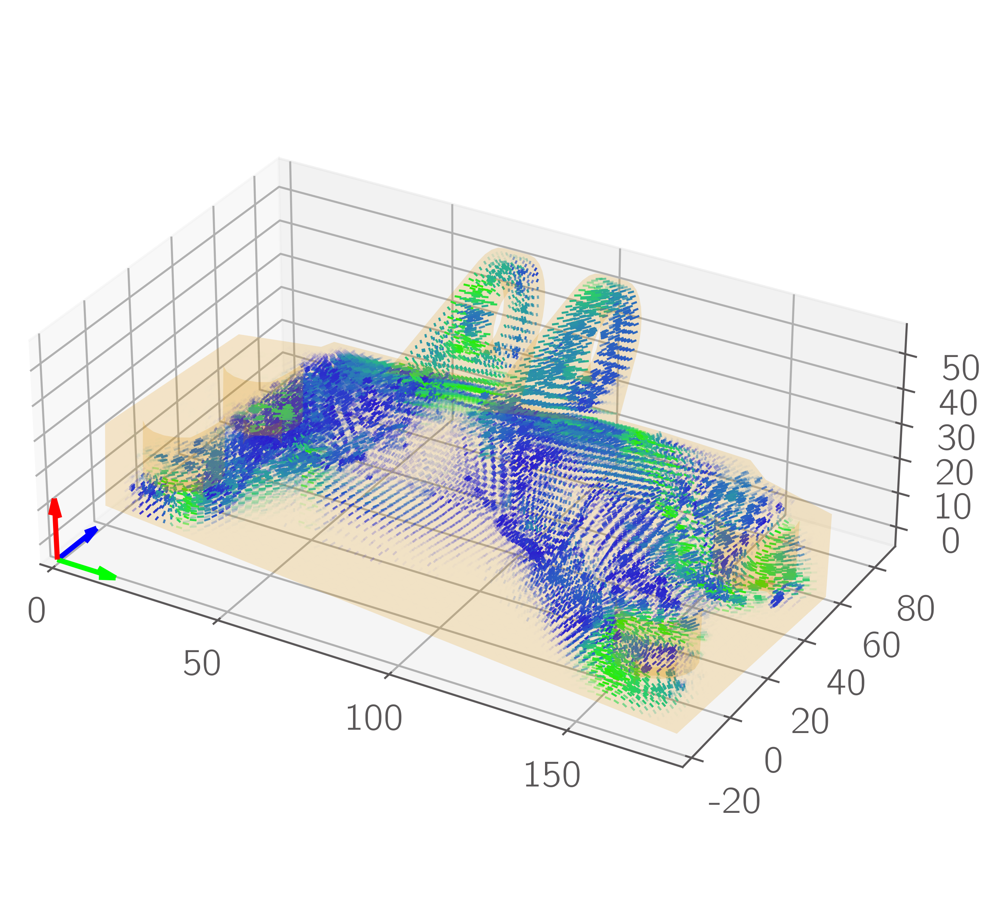

In [8]:
# solver6 = TopOpt.load('results/bracket/hor_layer/topopt.json')
post6 = Post3D(solver6)
post6.plot(domain_stl='models/bracket.stl')

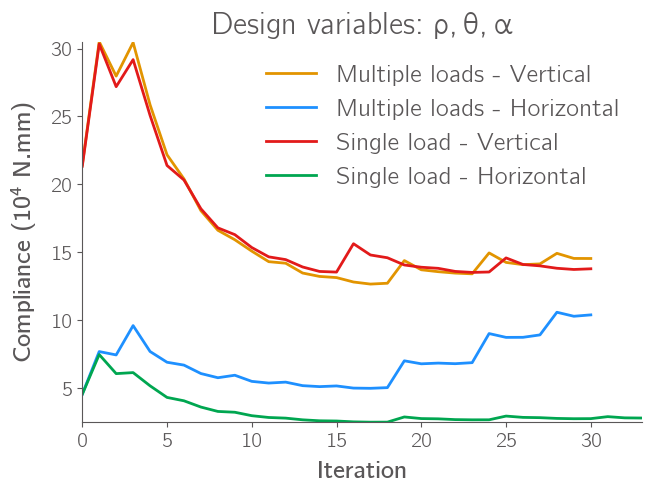

In [12]:
plt.figure()
plt.plot(solver1.comp_hist[0], label='Multiple loads - Vertical')
plt.plot(solver1.comp_hist[1], label='Multiple loads - Horizontal')
plt.plot(solver2.comp_hist[0], label='Single load - Vertical')
plt.plot(solver3.comp_hist[0], label='Single load - Horizontal')
plt.ylabel(r'Compliance ($10^4$ N.mm)')
plt.xlabel('Iteration')
plt.title(r'Design variables: $\rho, \theta, \alpha$')
plt.legend()

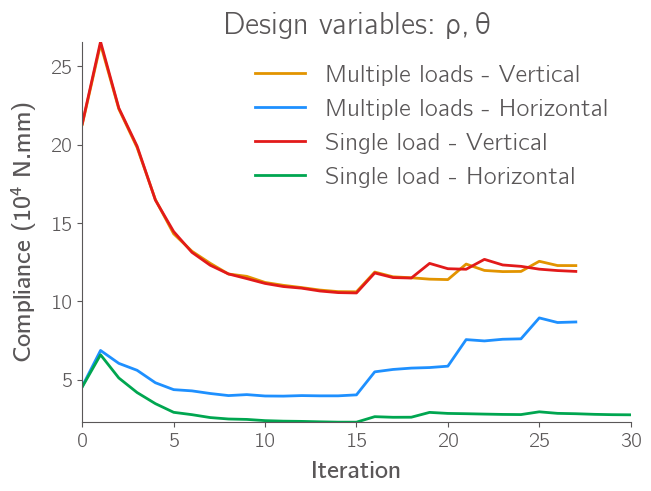

In [17]:
plt.figure()
plt.plot(solver4.comp_hist[0], label='Multiple loads - Vertical')
plt.plot(solver4.comp_hist[1], label='Multiple loads - Horizontal')
plt.plot(solver5.comp_hist[0], label='Single load - Vertical')
plt.plot(solver6.comp_hist[0], label='Single load - Horizontal')
plt.ylabel(r'Compliance ($10^4$ N.mm)')
plt.xlabel('Iteration')
plt.title(r'Design variables: $\rho, \theta$')
plt.legend()

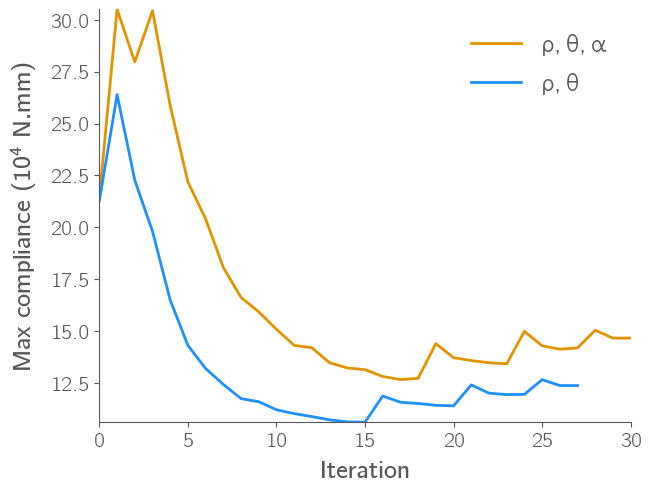

In [18]:
plt.figure()
plt.plot(solver1.comp_max_hist, label=r'$\rho, \theta, \alpha$')
plt.plot(solver4.comp_max_hist, label=r'$\rho, \theta$')
plt.ylabel(r'Max compliance ($10^4$ N.mm)')
plt.xlabel('Iteration')
plt.legend()

In [10]:
# get final solver2 compliance for horizontal force
eval1 = TopOpt(inputfiles='bracket_hor', dim='3D_free', jobname='ver_free2', echo=False)
eval1.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
comp2_hor = eval1.fea(solver2.x.copy())

# get final solver3 compliance for vertical force
eval2 = TopOpt(inputfiles='bracket_ver', dim='3D_free', jobname='hor_free2', echo=False)
eval2.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
comp3_ver = eval2.fea(solver3.x.copy())

# get final solver5 compliance for horizontal force
eval3 = TopOpt(inputfiles='bracket_hor', dim='3D_layer', jobname='ver_layer2', echo=False)
eval3.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
comp5_hor = eval3.fea(solver5.x.copy())

# get final solver6 compliance for vertical force
eval4 = TopOpt(inputfiles='bracket_ver', dim='3D_layer', jobname='hor_layer2', echo=False)
eval4.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
comp6_ver = eval4.fea(solver6.x.copy())

In [11]:
print('Final compliance (10^4 N.mm) - rho, theta, alpha')
print('-'*(18*3+4))
print('|{:^18}|{:^18}|{:^18}|'.format('Optim load cases','c1','c2'))
print('-'*(18*3+4))
print('|{:^18}|{:^18.3f}|{:^18.3f}|'.format('Both',solver1.comp_hist[0][-1],solver1.comp_hist[1][-1]))
print('|{:^18}|{:^18.3f}|{:^18.3f}|'.format('Vertical only',solver2.comp_hist[0][-1],comp2_hor))
print('|{:^18}|{:^18.3f}|{:^18.3f}|'.format('Horizontal only',comp3_ver,solver3.comp_hist[0][-1]))
print('-'*(18*3+4))

print()

print('Final compliance (10^4 N.mm) - rho, theta')
print('-'*(18*3+4))
print('|{:^18}|{:^18}|{:^18}|'.format('Optim load cases','c1','c2'))
print('-'*(18*3+4))
print('|{:^18}|{:^18.3f}|{:^18.3f}|'.format('Both',solver4.comp_hist[0][-1],solver4.comp_hist[1][-1]))
print('|{:^18}|{:^18.3f}|{:^18.3f}|'.format('Vertical only',solver5.comp_hist[0][-1],comp5_hor))
print('|{:^18}|{:^18.3f}|{:^18.3f}|'.format('Horizontal only',comp6_ver,solver6.comp_hist[0][-1]))
print('-'*(18*3+4))

Final compliance (10^4 N.mm) - rho, theta, alpha
----------------------------------------------------------
| Optim load cases |        c1        |        c2        |
----------------------------------------------------------
|       Both       |      14.544      |      10.393      |
|  Vertical only   |      13.786      |      16.088      |
| Horizontal only  |     127.257      |      2.799       |
----------------------------------------------------------

Final compliance (10^4 N.mm) - rho, theta
----------------------------------------------------------
| Optim load cases |        c1        |        c2        |
----------------------------------------------------------
|       Both       |      12.282      |      8.687       |
|  Vertical only   |      11.910      |      12.810      |
| Horizontal only  |     121.340      |      2.766       |
----------------------------------------------------------
